In [1]:
# read doc
import pandas as pd
df=pd.read_csv('AirlineReviewDataset.csv',index_col=0)
pd.set_option('display.max_rows', df.shape[0]+1)

df.head()

,airline_name,author,author_country,content,cabin_flown,overall_rating,seat_comfort_rating,cabin_staff_rating,food_beverages_rating,inflight_entertainment_rating,value_money_rating,Month,Year,recommended
0,adria-airways,D Ito,Germany,Outbound flight FRA/PRN A319. 2 hours 10 min f...,Economy,7.0,4.0,4.0,4.0,0.0,4.0,4,2015,1
1,adria-airways,Ron Kuhlmann,United States,Two short hops ZRH-LJU and LJU-VIE. Very fast ...,Business Class,10.0,4.0,5.0,4.0,1.0,5.0,1,2015,1
2,adria-airways,E Albin,Switzerland,Flew Zurich-Ljubljana on JP365 newish CRJ900. ...,Economy,9.0,5.0,5.0,4.0,0.0,5.0,9,2014,1
3,adria-airways,Tercon Bojan,Singapore,Adria serves this 100 min flight from Ljubljan...,Business Class,8.0,4.0,4.0,3.0,1.0,4.0,9,2014,1
4,adria-airways,L James,Poland,WAW-SKJ Economy. No free snacks or drinks on t...,Economy,4.0,4.0,2.0,1.0,2.0,2.0,6,2014,0


In [2]:
df.columns

Index(['airline_name', 'author', 'author_country', 'content', 'cabin_flown',
       'overall_rating', 'seat_comfort_rating', 'cabin_staff_rating',
       'food_beverages_rating', 'inflight_entertainment_rating',
       'value_money_rating', 'Month', 'Year', 'recommended'],
      dtype='object')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27284 entries, 0 to 41217
Data columns (total 14 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   airline_name                   27284 non-null  object 
 1   author                         27284 non-null  object 
 2   author_country                 27284 non-null  object 
 3   content                        27284 non-null  object 
 4   cabin_flown                    27284 non-null  object 
 5   overall_rating                 27284 non-null  float64
 6   seat_comfort_rating            27284 non-null  float64
 7   cabin_staff_rating             27284 non-null  float64
 8   food_beverages_rating          27284 non-null  float64
 9   inflight_entertainment_rating  27284 non-null  float64
 10  value_money_rating             27284 non-null  float64
 11  Month                          27284 non-null  int64  
 12  Year                           27284 non-null 

In [4]:
df.isnull().sum()

airline_name                     0
author                           0
author_country                   0
content                          0
cabin_flown                      0
overall_rating                   0
seat_comfort_rating              0
cabin_staff_rating               0
food_beverages_rating            0
inflight_entertainment_rating    0
value_money_rating               0
Month                            0
Year                             0
recommended                      0
dtype: int64

In [5]:
#check top 10 with highest review
pivot=pd.pivot_table(data=df,index='airline_name',values='content',aggfunc='count')
result = pivot.sort_values(('content'), ascending=False)[:10]
print(result)

                        content
airline_name                   
british-airways             855
united-airlines             803
air-canada-rouge            703
emirates                    685
lufthansa                   586
american-airlines           579
qantas-airways              576
etihad-airways              512
cathay-pacific-airways      491
qatar-airways               491


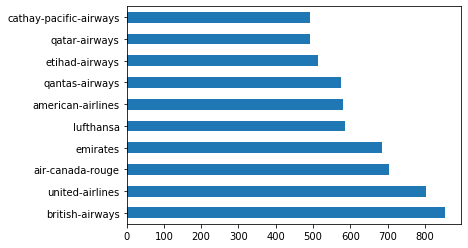

In [6]:
# Top 10 review in visualization
import matplotlib.pyplot as plt
airline_count = pd.value_counts(df['airline_name'].values, sort=True)[:10]
airline_count.plot.barh()
plt.show()


In [12]:
#conver object into string:

content=df['content'].tolist()
content
content_str=str(content).strip('[]')
content_str


'"Outbound flight FRA/PRN A319. 2 hours 10 min flight. I thought drinks/snacks for sale but sandwich soft drinks were served complimentary. Inbound flights SKP/LJU/FRA CRJ900. each 1 hour 30 min flight. Skyshop menu was in a seat pocket and drinks/snacks were for sale. All flight crews were friendly. Security check at the Ljubljana airport for transit passengers was chaos however it\'s possible to go to a gate within 30min.", \'Two short hops ZRH-LJU and LJU-VIE. Very fast on CRJ 90. Seats comfortable and crew was fine. Ground services good and lounge was quite nice.\', \'Flew Zurich-Ljubljana on JP365 newish CRJ900. Flight almost full departure on time. Service on board by 2 pleasant and friendly female flight attendants. I bought coffee mineral water and a very nice and fresh filled croissant for EUR 6. Good value!\', "Adria serves this 100 min flight from Ljubljana to Amsterdam on a brand new CRJ900 Next Gen which has a hugely improved cabin. Much more spacious higher ceiling and wi

In [11]:
# Extract words except puncuations


import nltk
from nltk.corpus import stopwords
stopwords=stopwords.words('english')
# stopwords
words=nltk.word_tokenize(content_str)
only_words=[x.lower() for x in words if x.isalpha()]
free_stopwords=[w for w in only_words if not w in stopwords]
free_stopwords
words_pos=nltk.pos_tag(free_stopwords)
# # only_words
# words_pos

In [10]:
#check the airline market by extracting JJ

jj=[(x, y) for x,y  in words_pos if y.startswith('JJ')]
jj

jj_word=[x[0] for x in words_pos[:-1] if x[1].startswith('JJ')]
frequency_w=nltk.FreqDist(jj_word).most_common(10)
frequency_w

[('good', 15632),
 ('comfortable', 5930),
 ('new', 5813),
 ('great', 5564),
 ('excellent', 4488),
 ('first', 4005),
 ('nice', 3716),
 ('old', 3658),
 ('friendly', 3406),
 ('due', 3168)]

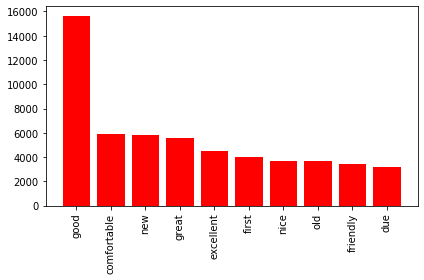

In [13]:
# airline market under a visualization:

import numpy as np
import matplotlib.pyplot as plt

word = []
frequency = []

for i in range(len(frequency_w)):
    word.append(frequency_w[i][0])
    frequency.append(frequency_w[i][1])

indices = np.arange(len(frequency_w))
plt.bar(indices, frequency, color='r')
plt.xticks(indices, word, rotation='vertical')
plt.tight_layout()
plt.show()

In [14]:
#Pull out top 3 for texting analysis:

british_airways=df.loc[df['airline_name']=="british-airways",['airline_name','content','recommended']]
united_airlines=df.loc[df['airline_name']=="united-airlines",['airline_name','content','recommended']]
air_canada=df.loc[df['airline_name']=="air-canada-rouge",['airline_name','content','recommended']]
# british_airways
df_combine=pd.concat([british_airways, united_airlines,air_canada], axis=0)
df_combine=df_combine.sort_values(['airline_name','recommended'],ascending=(True,True)).reset_index(drop=True)
df_combine

,airline_name,content,recommended
0,air-canada-rouge,"Flew to Lisbon from Toronto July 27 2015, plan...",0
1,air-canada-rouge,We are a family of 5 who had booked a flight f...,0
2,air-canada-rouge,I checked our family of 6 in online before we ...,0
3,air-canada-rouge,It was a 12 hour flight from Vancouver to Osak...,0
4,air-canada-rouge,Done all necessary procedure to make sure my g...,0
5,air-canada-rouge,Worse than Air Transat. Terrible price-quality...,0
6,air-canada-rouge,Now while I like the color scheme on exterior ...,0
7,air-canada-rouge,I have traveled to Europe many times. This was...,0
8,air-canada-rouge,I travel quite a bit and have been a fairly lo...,0
9,air-canada-rouge,Boeing 767 on the way to Vegas and A319 on the...,0


In [16]:
import pandas as pd
import numpy as np
from nltk.tokenize import sent_tokenize, word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
import nltk
import string
import random
import re

In [13]:
import pandas as pd
df=pd.read_csv('airline review.csv')
df

,airline_name,content,recommended
0,air-canada-rouge,"Flew to Lisbon from Toronto July 27 2015, plan...",0
1,air-canada-rouge,We are a family of 5 who had booked a flight f...,0
2,air-canada-rouge,I checked our family of 6 in online before we ...,0
3,air-canada-rouge,It was a 12 hour flight from Vancouver to Osak...,0
4,air-canada-rouge,Done all necessary procedure to make sure my g...,0
5,air-canada-rouge,Worse than Air Transat. Terrible price-quality...,0
6,air-canada-rouge,Now while I like the color scheme on exterior ...,0
7,air-canada-rouge,I have traveled to Europe many times. This was...,0
8,air-canada-rouge,I travel quite a bit and have been a fairly lo...,0
9,air-canada-rouge,Boeing 767 on the way to Vegas and A319 on the...,0
